In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_style('darkgrid')
from sklearn.preprocessing import StandardScaler , LabelEncoder , OneHotEncoder,OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score,roc_curve, accuracy_score
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
bank = pd.read_csv(r"C:\Users\shree\Desktop\subject\Data_Science\DS_Assignments\Datasets\bank-full.csv",delimiter = ";" )

In [3]:
bank.shape

(45211, 17)

In [4]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [5]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [6]:
bank.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [7]:
bank.duplicated().value_counts()

False    45211
dtype: int64

In [8]:
col = ['job','marital','education','default','housing','loan','contact','month','poutcome']

In [9]:
for i in col:
    print(bank[i].value_counts())

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64
no     44396
yes      815
Name: default, dtype: int64
yes    25130
no     20081
Name: housing, dtype: int64
no     37967
yes     7244
Name: loan, dtype: int64
cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64
may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64
unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64


## Descriptive Statisctis

In [10]:
bank.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


<Axes: >

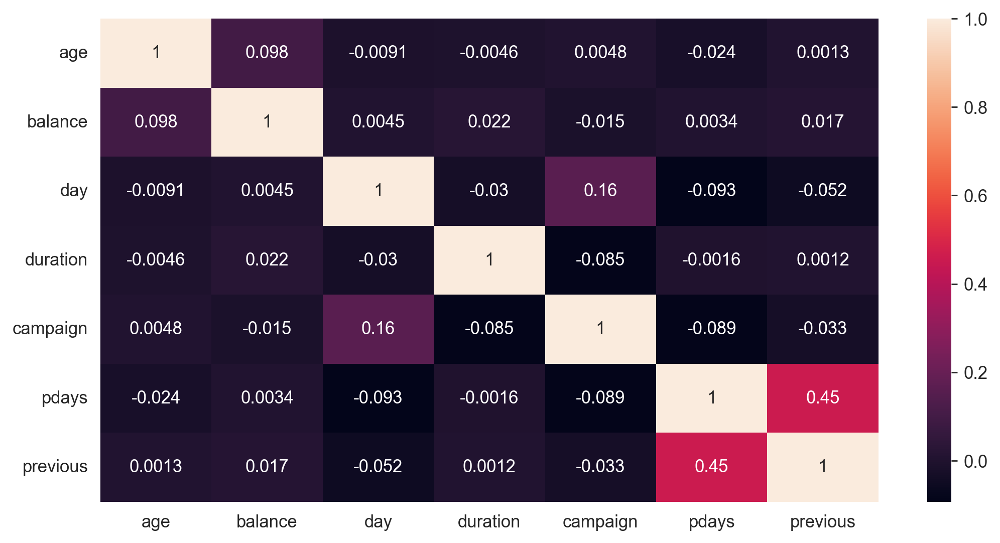

In [11]:
sns.heatmap(bank.corr(),annot = True)

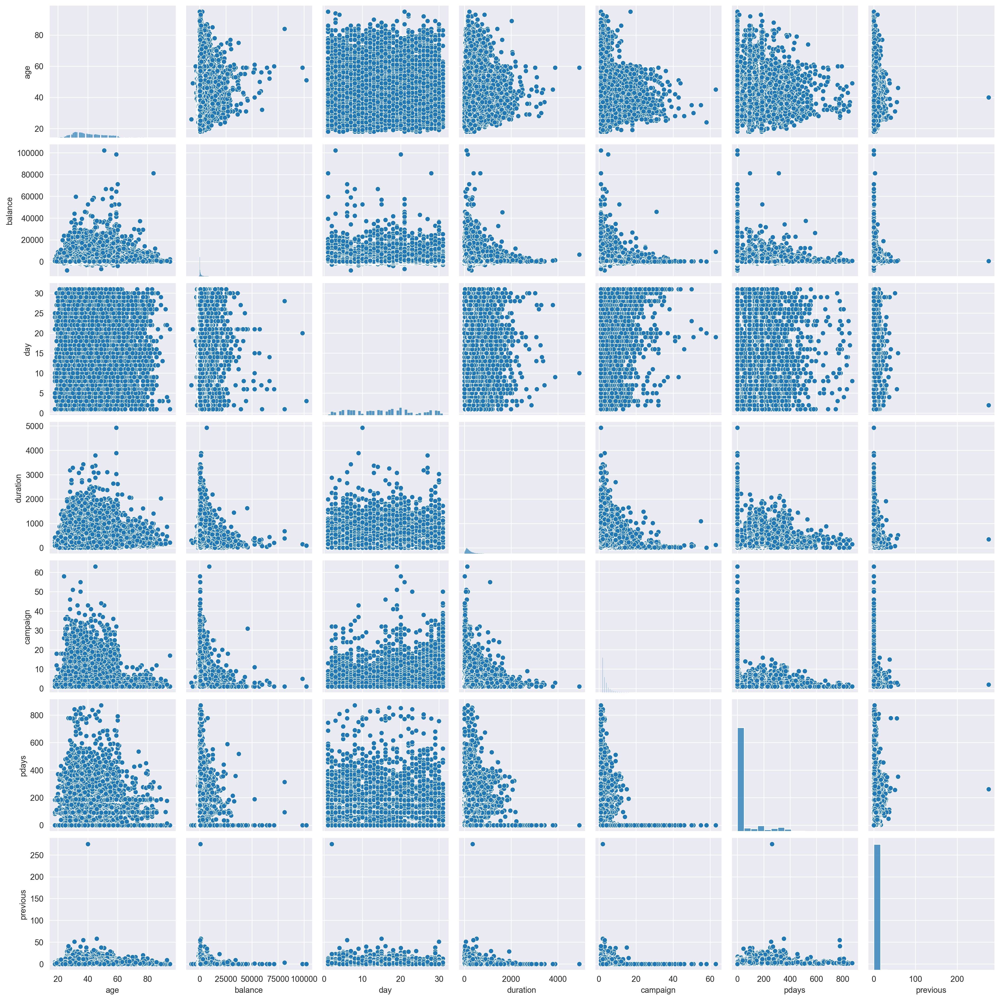

In [12]:
sns.pairplot(bank)

## EDA and Feature Engineering

## Univariate Analysis
1. Age
 - from box plot it seems there are some outliers presents, but the outlies seems legimate so not removing them

In [13]:
bank.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


<Axes: xlabel='age', ylabel='Density'>

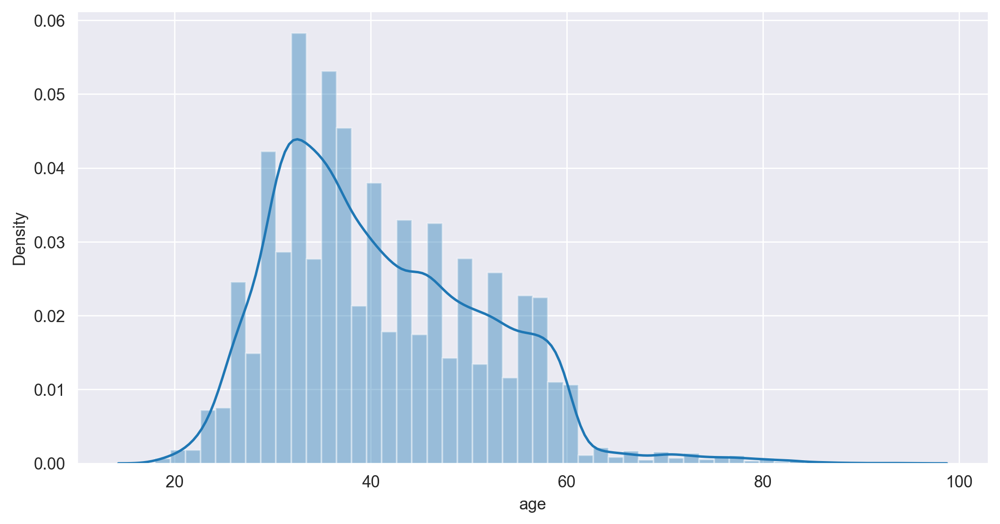

In [14]:
sns.distplot(bank['age'])

In [15]:
pe.box(bank['age'])

In [16]:
bank[bank['age']>70]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
29158,83,retired,married,primary,no,425,no,no,telephone,2,feb,912,1,-1,0,unknown,no
29261,75,retired,divorced,primary,no,46,no,no,cellular,2,feb,294,1,-1,0,unknown,no
29263,75,retired,married,primary,no,3324,no,no,cellular,2,feb,149,1,-1,0,unknown,no
29322,83,retired,married,tertiary,no,6236,no,no,cellular,2,feb,283,2,-1,0,unknown,no
29865,75,retired,divorced,primary,no,3881,yes,no,cellular,4,feb,136,3,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45163,71,retired,married,secondary,no,2064,no,no,cellular,9,nov,379,2,92,3,failure,no
45191,75,retired,divorced,tertiary,no,3810,yes,no,cellular,16,nov,262,1,183,1,failure,yes
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes


<Axes: xlabel='age', ylabel='Density'>

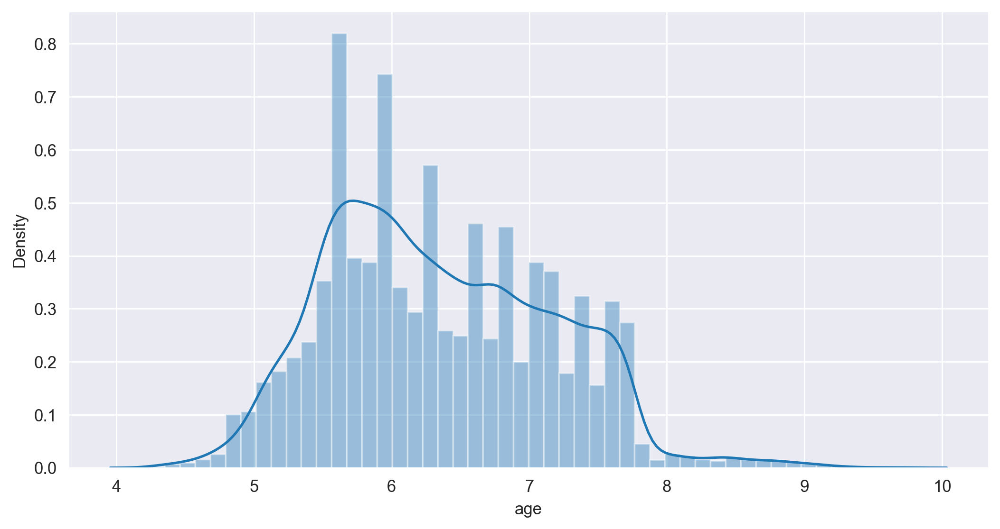

In [17]:
sns.distplot(np.sqrt(bank['age']))

2. Job

In [18]:
bank['job'].value_counts()

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [19]:
bank['job'].replace('unknown','blue-collar',inplace = True)

In [20]:
pd.crosstab(index = bank['job'],columns = bank['y'])

y,no,yes
job,,
admin.,4540,631
blue-collar,9278,742
entrepreneur,1364,123
housemaid,1131,109
management,8157,1301
retired,1748,516
self-employed,1392,187
services,3785,369
student,669,269


3. marital

In [21]:
bank['marital'].value_counts()

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

In [22]:
pd.crosstab(index = bank['marital'],columns = bank['y'])

y,no,yes
marital,,
divorced,4585,622
married,24459,2755
single,10878,1912


4. Education

In [23]:
bank['education'].value_counts()

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

In [24]:
bank['education'].replace('unknown','secondary',inplace = True)

In [25]:
pd.crosstab(index = bank['education'],columns = bank['y'])

y,no,yes
education,,
primary,6260,591
secondary,22357,2702
tertiary,11305,1996


5. default

In [26]:
bank['default'].value_counts()

no     44396
yes      815
Name: default, dtype: int64

In [27]:
pd.crosstab(index = bank['default'],columns = bank['y'])

y,no,yes
default,,
no,39159,5237
yes,763,52


6. balance

In [28]:
pe.box(bank['balance'])

In [29]:
bank[bank['balance'] > 3462].shape

(4712, 17)

In [30]:
data = np.log(bank['balance'])
data

0        7.669962
1        3.367296
2        0.693147
3        7.317212
4        0.000000
           ...   
45206    6.715383
45207    7.455298
45208    8.650850
45209    6.504288
45210    7.996654
Name: balance, Length: 45211, dtype: float64

In [31]:
data.median()

6.295266001439646

In [32]:
data = data.replace(-np.inf , 6.2952)

<Axes: xlabel='balance', ylabel='Density'>

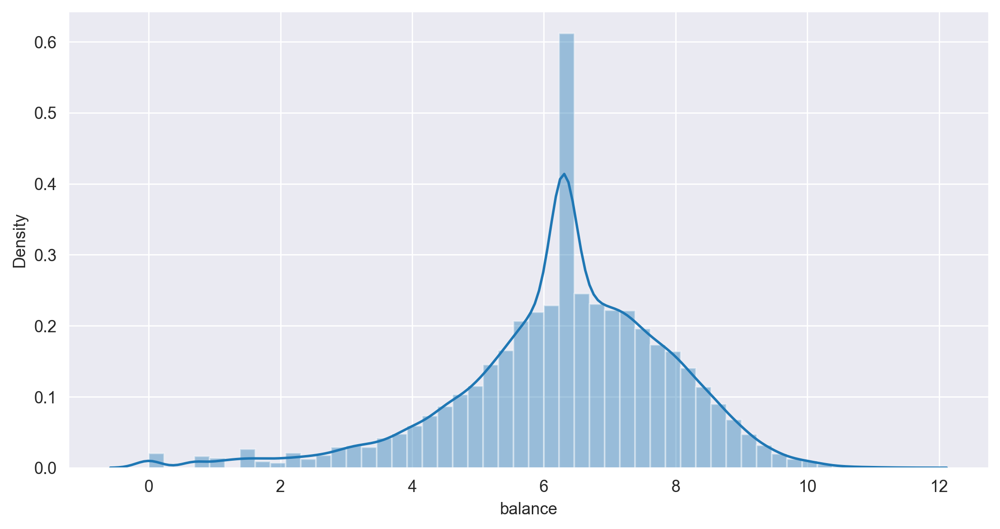

In [33]:
sns.distplot(data)

In [34]:
#bank['balance'] = data

In [35]:
#pe.box(bank['balance'])

7. housing

In [36]:
bank['housing'].value_counts()

yes    25130
no     20081
Name: housing, dtype: int64

In [37]:
pd.crosstab(bank['housing'],bank['y'])

y,no,yes
housing,,
no,16727,3354
yes,23195,1935


8. loan

In [38]:
bank['loan'].value_counts()

no     37967
yes     7244
Name: loan, dtype: int64

In [39]:
pd.crosstab(bank['loan'],bank['y'])

y,no,yes
loan,,
no,33162,4805
yes,6760,484


9. contact

In [40]:
bank['contact'].value_counts()

cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

In [41]:
pd.crosstab(bank['contact'],bank['y'])

y,no,yes
contact,,
cellular,24916,4369
telephone,2516,390
unknown,12490,530


In [42]:
bank['contact'].replace('unknown','cellular',inplace = True) 

 10 . day

In [43]:
bank = bank.drop(columns = ['day'])

11. month

In [44]:
bank['month'].value_counts()

may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64

12. duration

<Axes: xlabel='duration', ylabel='Density'>

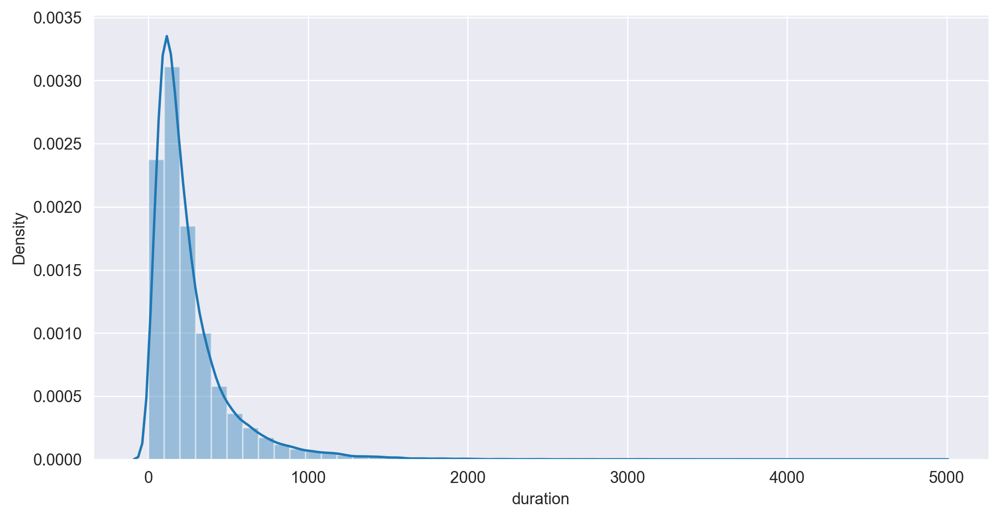

In [45]:
sns.distplot(bank['duration'])

In [46]:
data1 = np.log(bank['duration'])
data1

0        5.564520
1        5.017280
2        4.330733
3        4.521789
4        5.288267
           ...   
45206    6.884487
45207    6.122493
45208    7.027315
45209    6.230481
45210    5.888878
Name: duration, Length: 45211, dtype: float64

In [47]:
data1 = data.replace(-np.inf , 0)

<Axes: xlabel='balance', ylabel='Density'>

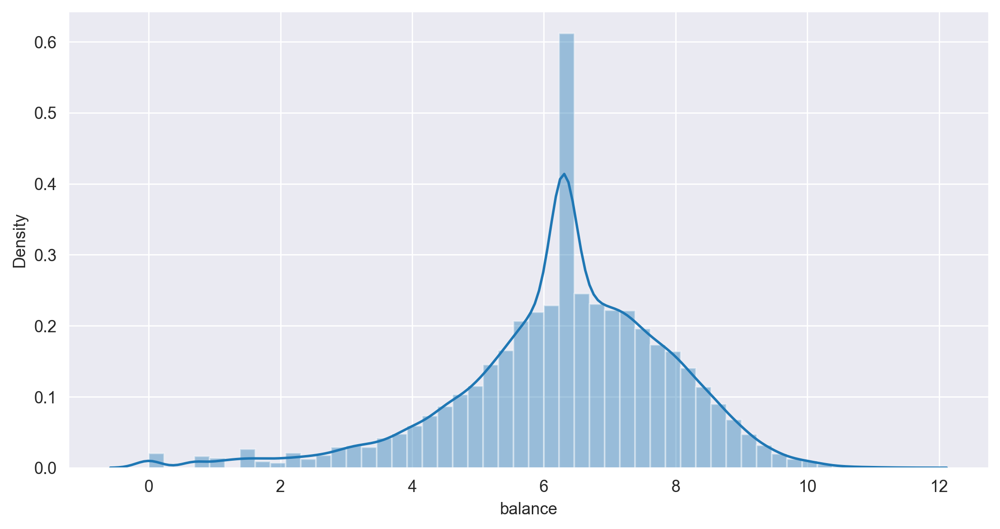

In [48]:
sns.distplot(data1)

13. campaign

<Axes: xlabel='campaign', ylabel='Density'>

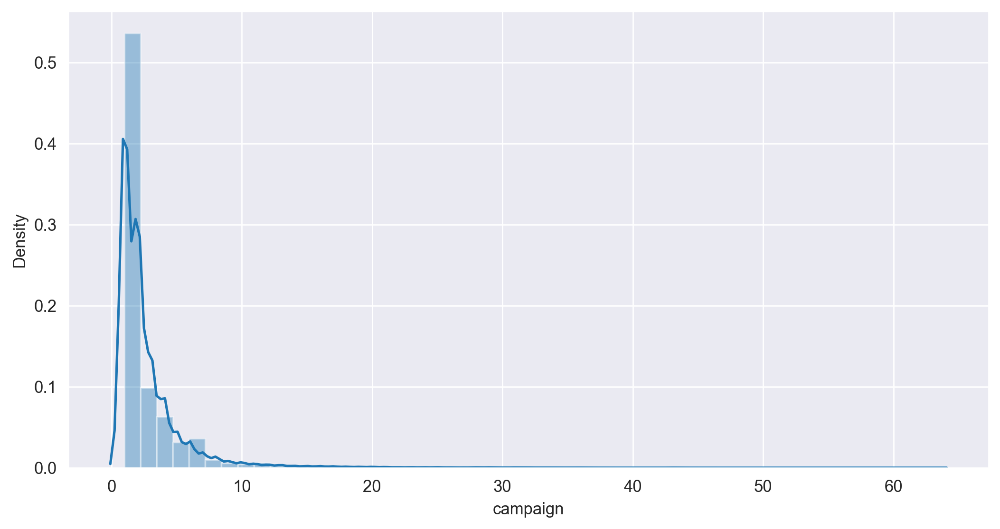

In [49]:
sns.distplot(bank['campaign'])

14. pdays

In [50]:
bank['pdays'].value_counts()

-1      36954
 182      167
 92       147
 91       126
 183      126
        ...  
 449        1
 452        1
 648        1
 595        1
 530        1
Name: pdays, Length: 559, dtype: int64

15. previous

In [51]:
bank['previous'].value_counts()

0      36954
1       2772
2       2106
3       1142
4        714
5        459
6        277
7        205
8        129
9         92
10        67
11        65
12        44
13        38
15        20
14        19
17        15
16        13
19        11
20         8
23         8
18         6
22         6
24         5
27         5
21         4
29         4
25         4
30         3
38         2
37         2
26         2
28         2
51         1
275        1
58         1
32         1
40         1
55         1
35         1
41         1
Name: previous, dtype: int64

16. poutcome

In [52]:
bank['poutcome'].value_counts()

unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

In [53]:
bank['poutcome'].replace('unknown','failure',inplace = True)

In [54]:
bank

,age,job,marital,education,default,balance,housing,loan,contact,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,cellular,may,261,1,-1,0,failure,no
1,44,technician,single,secondary,no,29,yes,no,cellular,may,151,1,-1,0,failure,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,cellular,may,76,1,-1,0,failure,no
3,47,blue-collar,married,secondary,no,1506,yes,no,cellular,may,92,1,-1,0,failure,no
4,33,blue-collar,single,secondary,no,1,no,no,cellular,may,198,1,-1,0,failure,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,nov,977,3,-1,0,failure,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,nov,456,2,-1,0,failure,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,nov,508,4,-1,0,failure,no


## Encoding 

In [55]:
le = LabelEncoder()
oe = OrdinalEncoder()

In [56]:
bank2 =  pd.get_dummies(bank , columns = ['job','marital','default','housing','loan','contact','month','poutcome'],drop_first = True)

In [57]:
bank2

,age,education,balance,duration,campaign,pdays,previous,y,job_blue-collar,job_entrepreneur,...,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success
0,58,tertiary,2143,261,1,-1,0,no,0,0,...,0,0,0,0,1,0,0,0,0,0
1,44,secondary,29,151,1,-1,0,no,0,0,...,0,0,0,0,1,0,0,0,0,0
2,33,secondary,2,76,1,-1,0,no,0,1,...,0,0,0,0,1,0,0,0,0,0
3,47,secondary,1506,92,1,-1,0,no,1,0,...,0,0,0,0,1,0,0,0,0,0
4,33,secondary,1,198,1,-1,0,no,1,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,tertiary,825,977,3,-1,0,yes,0,0,...,0,0,0,0,0,1,0,0,0,0
45207,71,primary,1729,456,2,-1,0,yes,0,0,...,0,0,0,0,0,1,0,0,0,0
45208,72,secondary,5715,1127,5,184,3,yes,0,0,...,0,0,0,0,0,1,0,0,0,1
45209,57,secondary,668,508,4,-1,0,no,1,0,...,0,0,0,0,0,1,0,0,0,0


In [58]:
oe.fit(bank2[["education"]])
bank2[["education"]] = oe.transform(bank2[["education"]])

In [59]:
x = bank2.drop(columns = ['y'])

In [60]:
x

,age,education,balance,duration,campaign,pdays,previous,job_blue-collar,job_entrepreneur,job_housemaid,...,month_jan,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success
0,58,2.0,2143,261,1,-1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,44,1.0,29,151,1,-1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,33,1.0,2,76,1,-1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
3,47,1.0,1506,92,1,-1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
4,33,1.0,1,198,1,-1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,2.0,825,977,3,-1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
45207,71,0.0,1729,456,2,-1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
45208,72,1.0,5715,1127,5,184,3,0,0,0,...,0,0,0,0,0,1,0,0,0,1
45209,57,1.0,668,508,4,-1,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0


In [61]:
 y = le.fit_transform(bank2['y'])

In [62]:
y = pd.Series(y)
y

0        0
1        0
2        0
3        0
4        0
        ..
45206    1
45207    1
45208    1
45209    0
45210    0
Length: 45211, dtype: int32

## Scaling

In [63]:
sc = StandardScaler()

In [64]:
x = pd.DataFrame(sc.fit_transform(x))

In [65]:
x

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,1.606965,1.314507,0.256419,0.011016,-0.569351,-0.411453,-0.251940,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
1,0.288529,-0.218740,-0.437895,-0.416127,-0.569351,-0.411453,-0.251940,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
2,-0.747384,-0.218740,-0.446762,-0.707361,-0.569351,-0.411453,-0.251940,-0.533603,5.422561,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
3,0.571051,-0.218740,0.047205,-0.645231,-0.569351,-0.411453,-0.251940,1.874053,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
4,-0.747384,-0.218740,-0.447091,-0.233620,-0.569351,-0.411453,-0.251940,1.874053,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.947747,1.314507,-0.176460,2.791329,0.076230,-0.411453,-0.251940,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,3.223067,-0.128819,-0.113898,-0.205972,-0.185948
45207,2.831227,-1.751986,0.120447,0.768224,-0.246560,-0.411453,-0.251940,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,3.223067,-0.128819,-0.113898,-0.205972,-0.185948
45208,2.925401,-0.218740,1.429593,3.373797,0.721811,1.436189,1.050473,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,3.223067,-0.128819,-0.113898,-0.205972,5.377848
45209,1.512791,-0.218740,-0.228024,0.970146,0.399020,-0.411453,-0.251940,1.874053,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,3.223067,-0.128819,-0.113898,-0.205972,-0.185948


In [66]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size = 0.2 , random_state = 42)

In [67]:
xtrain

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
3344,0.006007,-1.751986,-0.168577,-0.722893,-0.569351,-0.411453,-0.251940,1.874053,-0.184415,-0.167930,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
17965,0.759399,-1.751986,0.017318,0.042081,-0.246560,-0.411453,-0.251940,-0.533603,-0.184415,-0.167930,...,-0.178958,2.357344,-0.366006,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
18299,0.100181,-0.218740,0.814432,-0.497672,0.399020,-0.411453,-0.251940,-0.533603,-0.184415,-0.167930,...,-0.178958,2.357344,-0.366006,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
10221,-0.370689,1.314507,-0.486503,0.453692,2.658552,-0.411453,-0.251940,-0.533603,-0.184415,-0.167930,...,-0.178958,-0.424206,2.732196,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
32192,1.418617,-1.751986,0.701450,0.022665,-0.246560,-0.411453,-0.251940,1.874053,-0.184415,-0.167930,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0.288529,-1.751986,-0.099605,7.124890,-0.569351,-0.411453,-0.251940,-0.533603,-0.184415,5.954871,...,-0.178958,-0.424206,2.732196,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
44732,-1.689124,1.314507,-0.280574,-0.187023,-0.569351,0.517361,0.182198,-0.533603,-0.184415,-0.167930,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,-0.310263,-0.128819,8.779785,-0.205972,-0.185948
38158,-0.653211,1.314507,-0.014869,-0.074413,-0.569351,-0.411453,-0.251940,-0.533603,-0.184415,-0.167930,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
860,-0.747384,-0.218740,-0.393227,-0.571452,-0.569351,-0.411453,-0.251940,-0.533603,-0.184415,-0.167930,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948


In [68]:
lr = LogisticRegression()

In [69]:
lr.fit(xtrain,ytrain)

LogisticRegression()

In [70]:
lr.coef_

array([[ 0.00170315,  0.13793762,  0.03247487,  1.05904653, -0.27025114,
         0.1058393 ,  0.02614162, -0.15024857, -0.06688917, -0.07766662,
        -0.06845334,  0.04801326, -0.04954778, -0.06265291,  0.05371902,
        -0.07766802, -0.02681246, -0.08550853,  0.05871913, -0.01519219,
        -0.37856197, -0.15780906,  0.00772069, -0.24145015,  0.0334454 ,
        -0.0877115 , -0.21093143, -0.29458765, -0.22576675,  0.14839652,
        -0.49657404, -0.24476286,  0.09200921,  0.07426673,  0.06744804,
         0.43448528]])

In [71]:
ypred = lr.predict(xtest)

In [72]:
ypred = pd.Series(ypred)

In [73]:
ypred.value_counts()

0    8486
1     557
dtype: int64

In [74]:
confusion_matrix(ytest,ypred)

array([[7757,  195],
       [ 729,  362]], dtype=int64)

<Axes: >

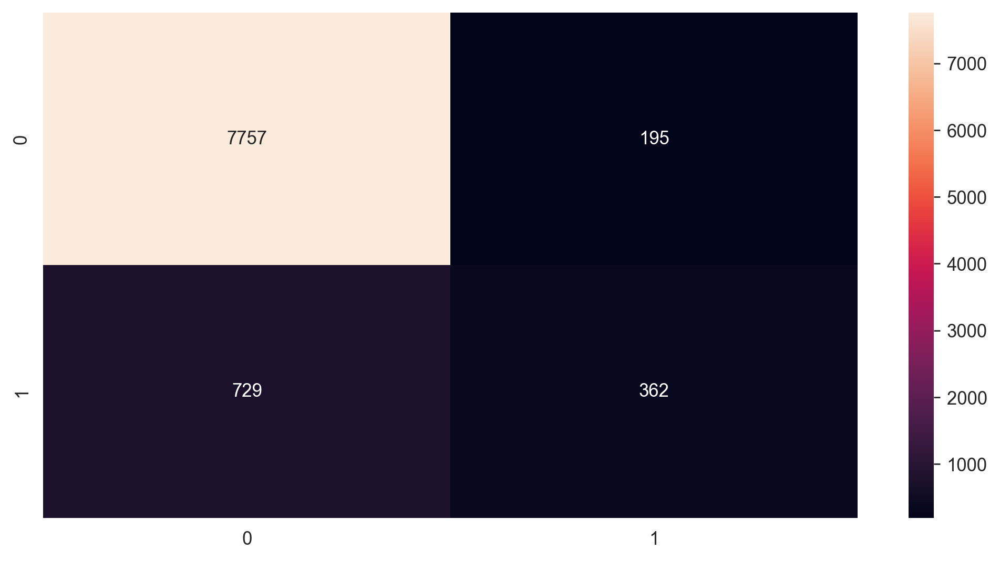

In [75]:
sns.heatmap(confusion_matrix(ytest,ypred),annot=True, fmt='g')

In [76]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      7952
           1       0.65      0.33      0.44      1091

    accuracy                           0.90      9043
   macro avg       0.78      0.65      0.69      9043
weighted avg       0.88      0.90      0.88      9043



## Thereshold Selection

In [77]:
xtest.head(3)

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
3776,-0.088167,-0.218740,-0.256926,-0.256919,-0.569351,-0.411453,-0.25194,1.874053,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,1.511374,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
9928,0.571051,-0.218740,0.749402,-0.680179,-0.246560,-0.411453,-0.25194,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,2.732196,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948
33409,-1.500776,1.314507,-0.270721,-0.124893,-0.569351,-0.411453,-0.25194,-0.533603,-0.184415,-0.16793,...,-0.178958,-0.424206,-0.366006,-0.103262,-0.661650,-0.310263,-0.128819,-0.113898,-0.205972,-0.185948


In [78]:
ypred[:5]

0    0
1    0
2    0
3    0
4    0
dtype: int32

In [79]:
lr.predict_proba(xtest)[:,1]

array([0.01922268, 0.05506773, 0.18830726, ..., 0.0341413 , 0.01803104,
       0.05679163])

In [80]:
proba = lr.predict_proba(xtest)[:,1]
proba

array([0.01922268, 0.05506773, 0.18830726, ..., 0.0341413 , 0.01803104,
       0.05679163])

In [81]:
auc = roc_auc_score(ytest,proba)
auc

0.901483027403652

In [82]:
fpr,tpr,threshold = roc_curve(ytest,proba)

In [83]:
fpr

array([0.00000000e+00, 0.00000000e+00, 1.25754527e-04, ...,
       9.10965795e-01, 9.10965795e-01, 1.00000000e+00])

In [84]:
tpr

array([0.00000000e+00, 9.16590284e-04, 9.16590284e-04, ...,
       9.99083410e-01, 1.00000000e+00, 1.00000000e+00])

In [85]:
threshold

array([1.99993562e+00, 9.99935617e-01, 9.99532764e-01, ...,
       1.29902229e-02, 1.29653098e-02, 5.88832223e-04])

In [86]:
len(threshold)

1301

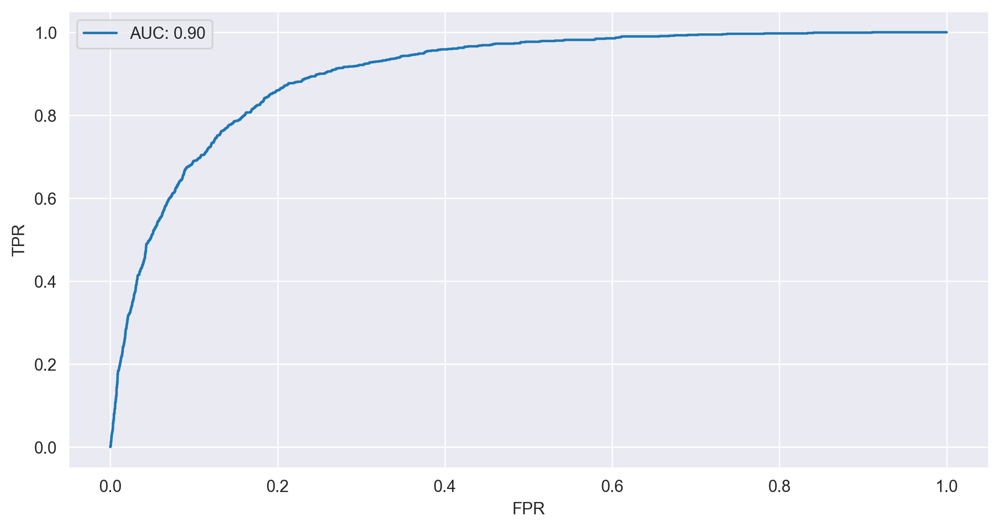

In [87]:
plt.plot(fpr,tpr, label = 'AUC: %0.2f'%auc)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()

In [88]:
threshold

array([1.99993562e+00, 9.99935617e-01, 9.99532764e-01, ...,
       1.29902229e-02, 1.29653098e-02, 5.88832223e-04])

In [89]:
proba

array([0.01922268, 0.05506773, 0.18830726, ..., 0.0341413 , 0.01803104,
       0.05679163])

In [90]:
accuracy = []

for i in threshold:
    ypred = np.where(proba>i,1,0)
    accuracy.append(accuracy_score(ytest,ypred))

In [91]:
accuracy

[0.8793541966161672,
 0.8793541966161672,
 0.8794647793873714,
 0.8793541966161672,
 0.8794647793873714,
 0.8793541966161672,
 0.8794647793873714,
 0.8793541966161672,
 0.8794647793873714,
 0.8794647793873714,
 0.8795753621585757,
 0.8800176932433926,
 0.8800176932433926,
 0.8802388587858012,
 0.8802388587858012,
 0.8804600243282097,
 0.8805706070994139,
 0.8809023554130266,
 0.8810129381842309,
 0.8810129381842309,
 0.8811235209554351,
 0.8813446864978436,
 0.8814552692690479,
 0.8813446864978436,
 0.8814552692690479,
 0.8815658520402522,
 0.8815658520402522,
 0.8816764348114564,
 0.8816764348114564,
 0.8818976003538649,
 0.8816764348114564,
 0.8817870175826606,
 0.8818976003538649,
 0.8820081831250691,
 0.8821187658962734,
 0.8821187658962734,
 0.8822293486674776,
 0.8832245936083158,
 0.8833351763795201,
 0.8832245936083158,
 0.8833351763795201,
 0.8833351763795201,
 0.8834457591507243,
 0.8833351763795201,
 0.8834457591507243,
 0.8836669246931328,
 0.883777507464337,
 0.88388809023

In [92]:
threshold_selection = pd.DataFrame({
    'Threshold' : threshold,
    'Accuracy' : accuracy
})

In [93]:
threshold_selection.sort_values(by = 'Accuracy',ascending=False)

,Threshold,Accuracy
405,0.337918,0.900476
325,0.408526,0.900365
406,0.337079,0.900365
328,0.404758,0.900365
330,0.403348,0.900254
...,...,...
1296,0.016828,0.260644
1297,0.016820,0.260533
1298,0.012990,0.198938
1299,0.012965,0.198828


In [94]:
from sklearn.preprocessing import binarize

In [95]:
proba

array([0.01922268, 0.05506773, 0.18830726, ..., 0.0341413 , 0.01803104,
       0.05679163])

In [96]:
new_pred = binarize([proba],threshold=0.435684)[0]

In [97]:
new_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [98]:
ytest

3776     0
9928     0
33409    0
31885    0
15738    0
        ..
13353    0
38732    1
5654     0
3779     0
11677    0
Length: 9043, dtype: int32

In [99]:
print(classification_report(ytest,new_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      7952
           1       0.64      0.39      0.48      1091

    accuracy                           0.90      9043
   macro avg       0.78      0.68      0.71      9043
weighted avg       0.89      0.90      0.89      9043

